# Prac 03. Part 2


In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from copy import deepcopy
plt.rcParams['figure.figsize'] = [15, 10]

Відкриття зображення

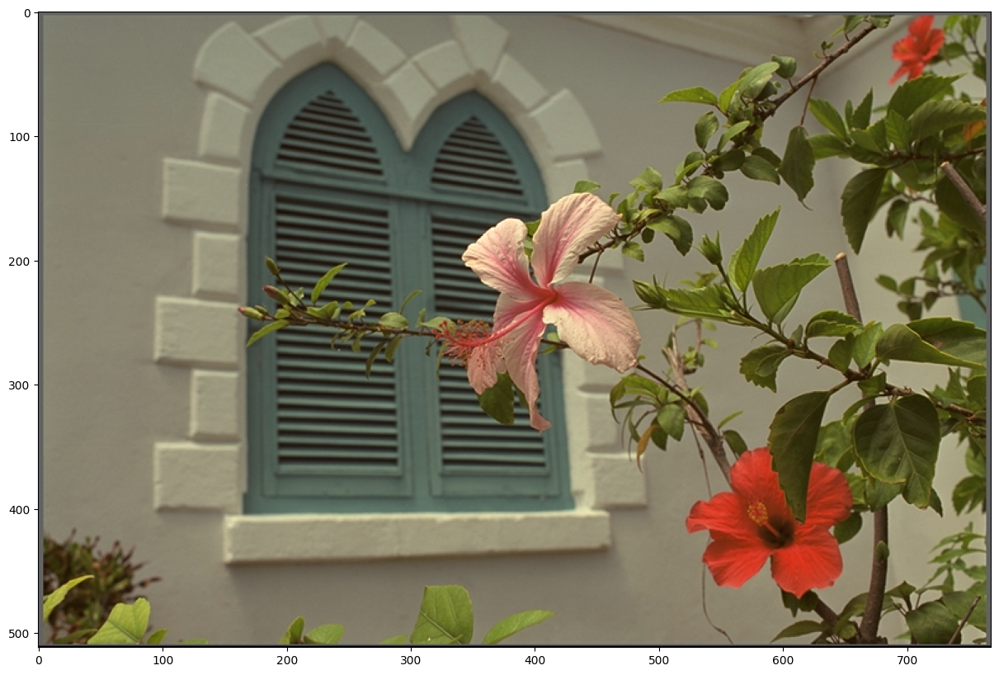

In [3]:
img = cv2.imread('kodim07.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

## Базові операції

Інвертування кольорової інтенсивності (saturation):

(<Axes: >, <matplotlib.image.AxesImage at 0x2000a31ec60>)

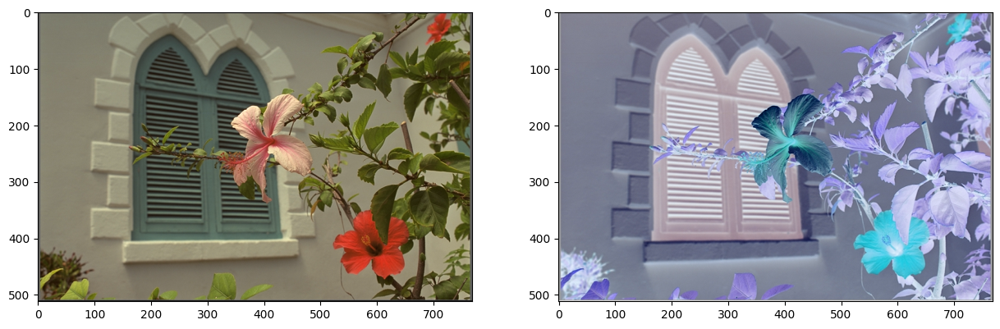

In [6]:
inverted = img
inverted = 255 - inverted # saturation channel
#inverted = cv2.cvtColor(inverted, cv2.COLOR_HSV2RGB)

plt.subplot(121), plt.imshow(img)
plt.subplot(122), plt.imshow(inverted)

Для деякої з компонент змінити на постійне значення.

(Обрано додавання 50 до червоного)

(<Axes: >, <matplotlib.image.AxesImage at 0x15b3905d790>)

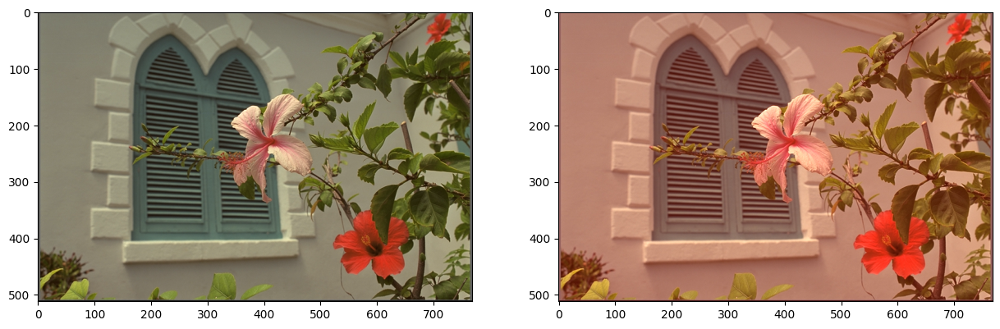

In [19]:
added = deepcopy(img)
added = added.astype(np.float32)
added[:,:,0] += 50
added = np.clip(added, 0, 255).astype(np.uint8)

plt.subplot(121), plt.imshow(img)
plt.subplot(122), plt.imshow(added)

Розбивка на компоненти Red, Green, Blue.

(<Axes: >, <matplotlib.image.AxesImage at 0x15b392961e0>)

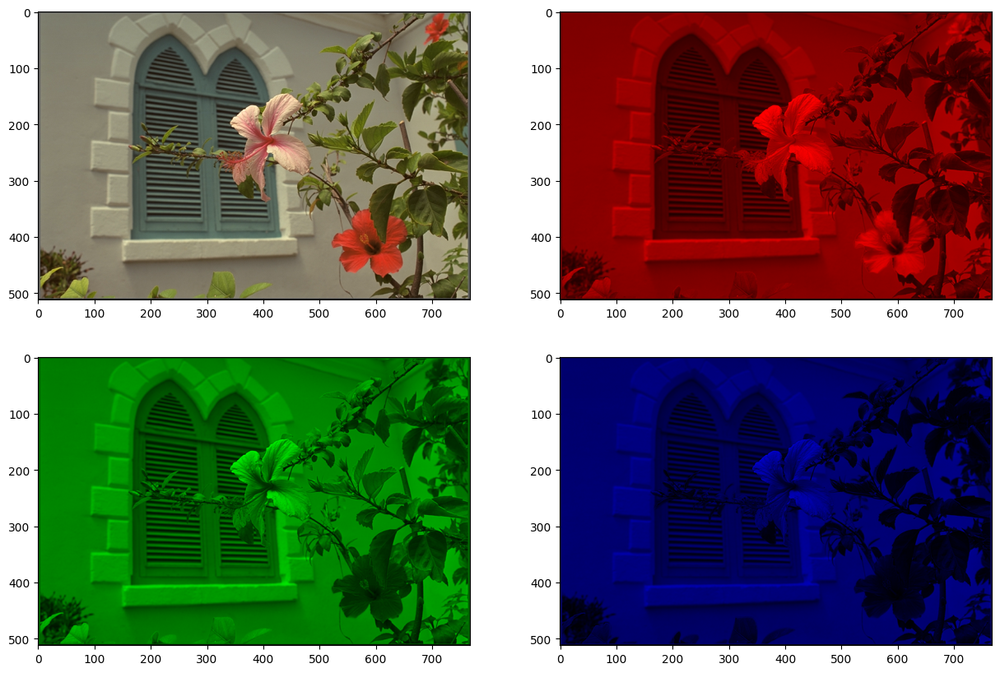

In [20]:
red, green, blue = cv2.split(img)

red_image = np.zeros_like(img)
red_image[:,:,0] = red

green_image = np.zeros_like(img)
green_image[:,:,1] = green

blue_image = np.zeros_like(img)
blue_image[:,:,2] = blue

plt.subplot(221), plt.imshow(img)
plt.subplot(222), plt.imshow(red_image)
plt.subplot(223), plt.imshow(green_image)
plt.subplot(224), plt.imshow(blue_image)

Злиття двох зображеннь з коефіцієнтом

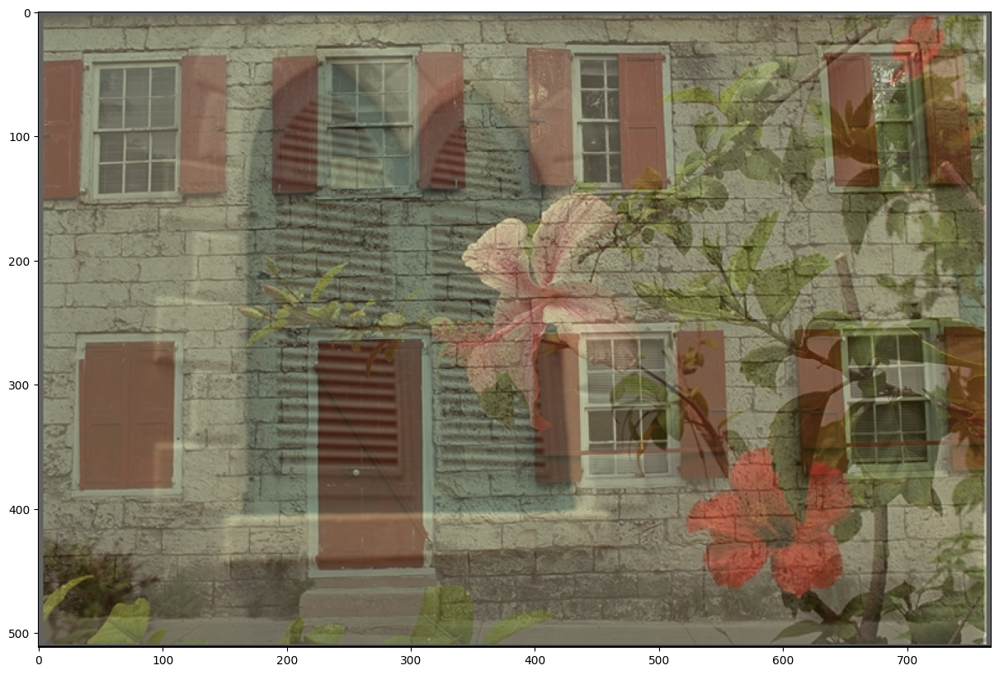

In [21]:
alpha = 0.5

img_1 = cv2.imread('kodim07.png')
img_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)

img_2 = cv2.imread('kodim01.png')
img_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)

img_3 = img_1.astype(np.float32)*alpha + img_2.astype(np.float32)*(1-alpha)

img_3 = np.clip(img_3, 0, 255).astype(np.uint8)

plt.imshow(img_3)

## Фільтри

Фільтрація зображення згорткою

(<Axes: >, <matplotlib.image.AxesImage at 0x15b3d62b110>)

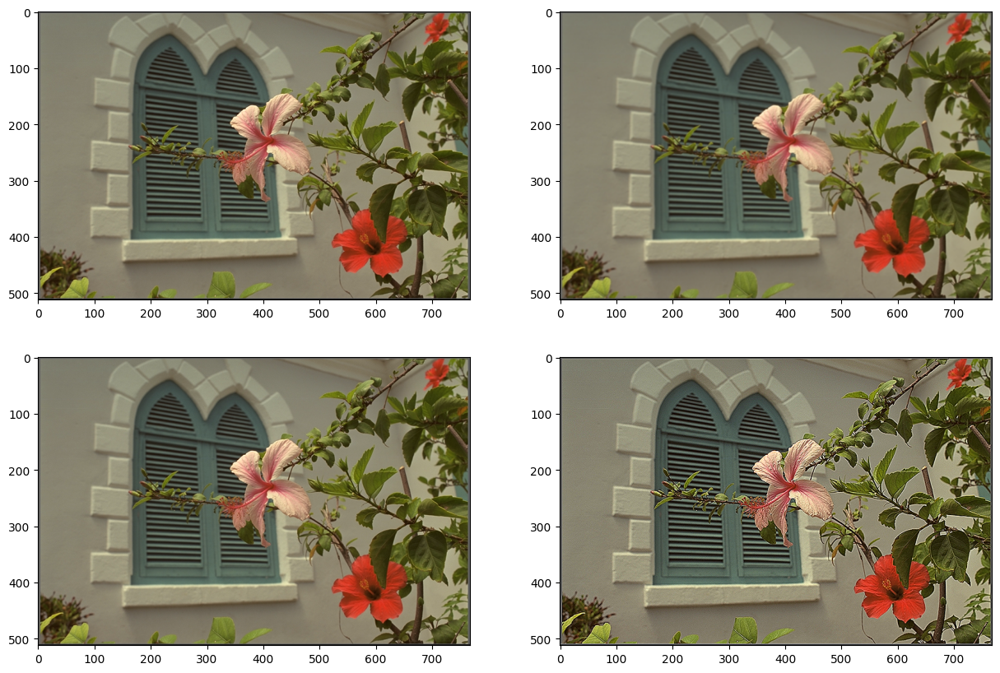

In [22]:
gauss_kernel = np.array([[0.0625, 0.125, 0.0625],
        [0.125,  0.25,  0.125],
        [0.0625, 0.125, 0.0625]])
sharpen_kernel = np.array([[0, -1, 0],
        [-1,  5,  -1],
        [0, -1, 0]])

blured_img = cv2.filter2D(src = img, ddepth = -1, kernel = gauss_kernel)
plt.subplot(221), plt.imshow(img)
plt.subplot(222), plt.imshow(blured_img)

sharpened_img = deepcopy(img).astype(np.float32)
sharpened_img = cv2.filter2D(src = img, ddepth = -1, kernel = sharpen_kernel)
sharpened_img = np.clip(sharpened_img, 0, 255).astype(np.uint8)
plt.subplot(223), plt.imshow(img)
plt.subplot(224), plt.imshow(sharpened_img)


Медіанний фільтр

(<Axes: >, <matplotlib.image.AxesImage at 0x15b3e5473e0>)

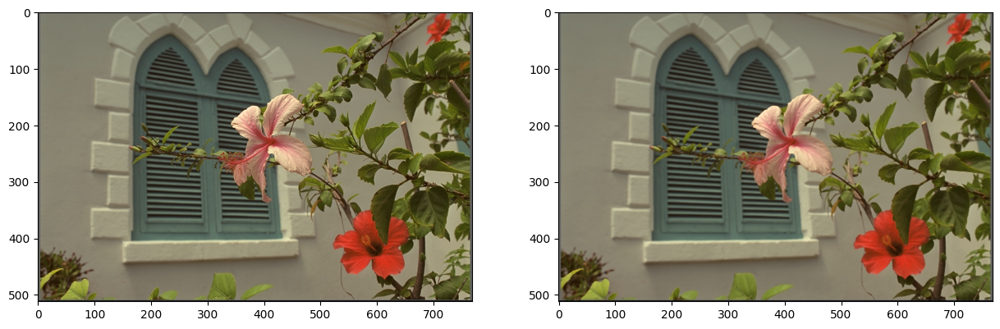

In [23]:
medianed = deepcopy(img)

for i in range(1, medianed.shape[0]-1):
    for j in range(1, medianed.shape[1]-1):
        neighbors = np.array([
            [img[i-1][j-1],img[i][j-1],img[i+1][j-1]],
            [img[i-1][j],img[i][j],img[i+1][j]],
            [img[i-1][j+1],img[i][j+1],img[i+1][j+1]],
        ])
        median_r = np.median(neighbors[:,:,0])
        median_g = np.median(neighbors[:,:,1])
        median_b = np.median(neighbors[:,:,2])
        medianed[i][j] = [median_r, median_g, median_b]

plt.subplot(121), plt.imshow(img)
plt.subplot(122), plt.imshow(medianed)
        

Фільтр ерозії та нарощування

(<Axes: >, <matplotlib.image.AxesImage at 0x15b3e5c9a00>)

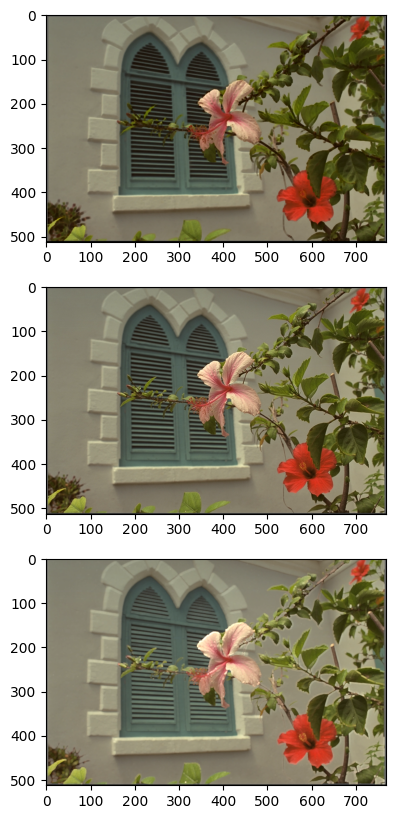

In [24]:
eroded = deepcopy(img)

for i in range(1, eroded.shape[0]-1):
    for j in range(1, eroded.shape[1]-1):
        neighbors = np.array([
            [img[i-1][j-1],img[i][j-1],img[i+1][j-1]],
            [img[i-1][j],img[i][j],img[i+1][j]],
            [img[i-1][j+1],img[i][j+1],img[i+1][j+1]],
        ])
        eroded_r = np.min(neighbors[:,:,0])
        eroded_g = np.min(neighbors[:,:,1])
        eroded_b = np.min(neighbors[:,:,2])
        eroded[i][j] = [eroded_r, eroded_g, eroded_b]

growed = deepcopy(img)

for i in range(1, growed.shape[0]-1):
    for j in range(1, growed.shape[1]-1):
        neighbors = np.array([
            [img[i-1][j-1],img[i][j-1],img[i+1][j-1]],
            [img[i-1][j],img[i][j],img[i+1][j]],
            [img[i-1][j+1],img[i][j+1],img[i+1][j+1]],
        ])
        growed_r = np.max(neighbors[:,:,0])
        growed_g = np.max(neighbors[:,:,1])
        growed_b = np.max(neighbors[:,:,2])
        growed[i][j] = [growed_r, growed_g, growed_b]

plt.subplot(311), plt.imshow(eroded)
plt.subplot(312), plt.imshow(img)
plt.subplot(313), plt.imshow(growed)

Фільтр Соболя

(<Axes: >, <matplotlib.image.AxesImage at 0x15b3ede6510>)

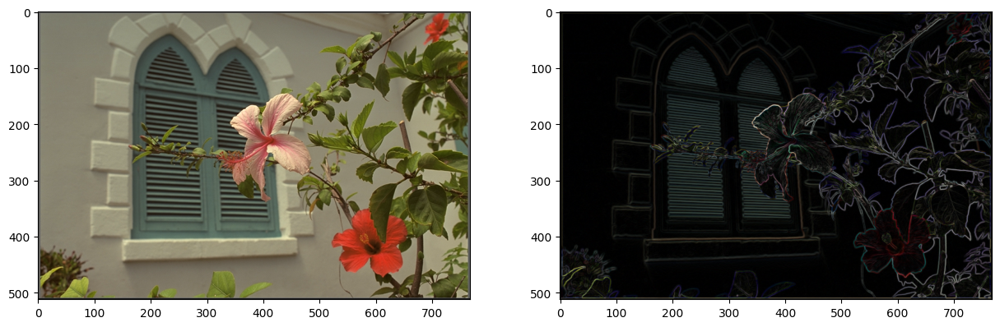

In [25]:
img_32 = img.astype(np.float32)

G_y_kernel = np.array([[-1, -2, -1],
        [0, 0, 0],
        [1, 2, 1]])
G_x_kernel = np.array([[-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1]])

G_y = cv2.filter2D(src = img_32, ddepth = -1, kernel = G_y_kernel)
G_x = cv2.filter2D(src = img_32, ddepth = -1, kernel = G_x_kernel)

G = np.sqrt(np.square(G_y) + np.square(G_x))
G -= np.min(G)
G /= np.max(G)
G *= 255
soboloed_img = np.clip(G, 0, 255).astype(np.uint8)

plt.subplot(223), plt.imshow(img)
plt.subplot(224), plt.imshow(soboloed_img)

## Вбудовування знаку

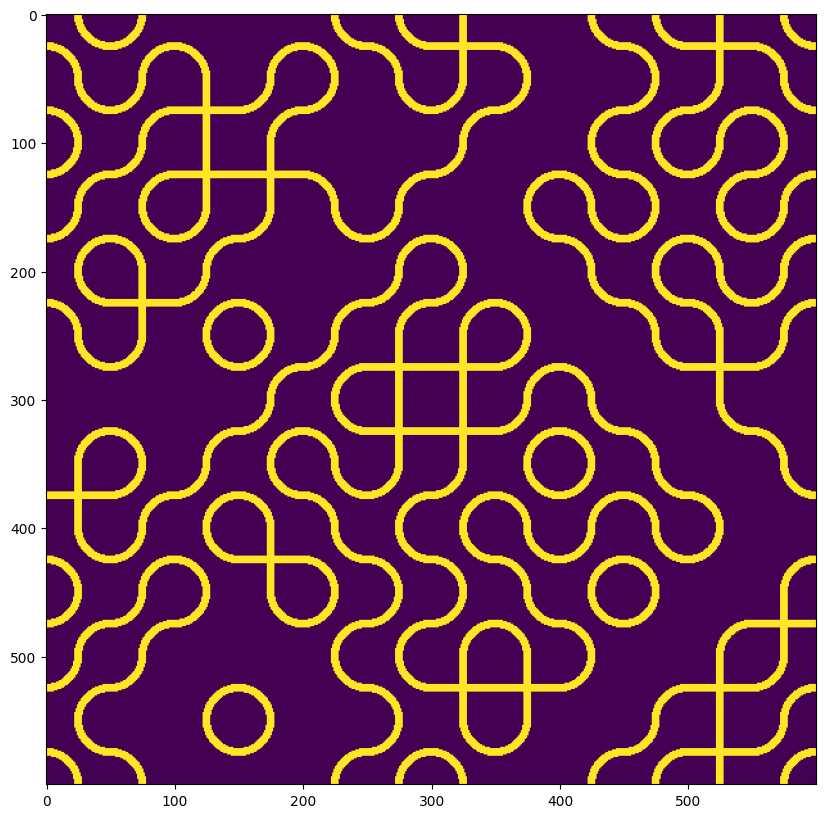

In [26]:
watermark = cv2.imread("watermark.jpg")
watermark = cv2.cvtColor(watermark, cv2.COLOR_BGR2GRAY)
watermark_binary = np.zeros_like(watermark)
watermark_binary[watermark < 127] = 1
plt.imshow(watermark_binary)

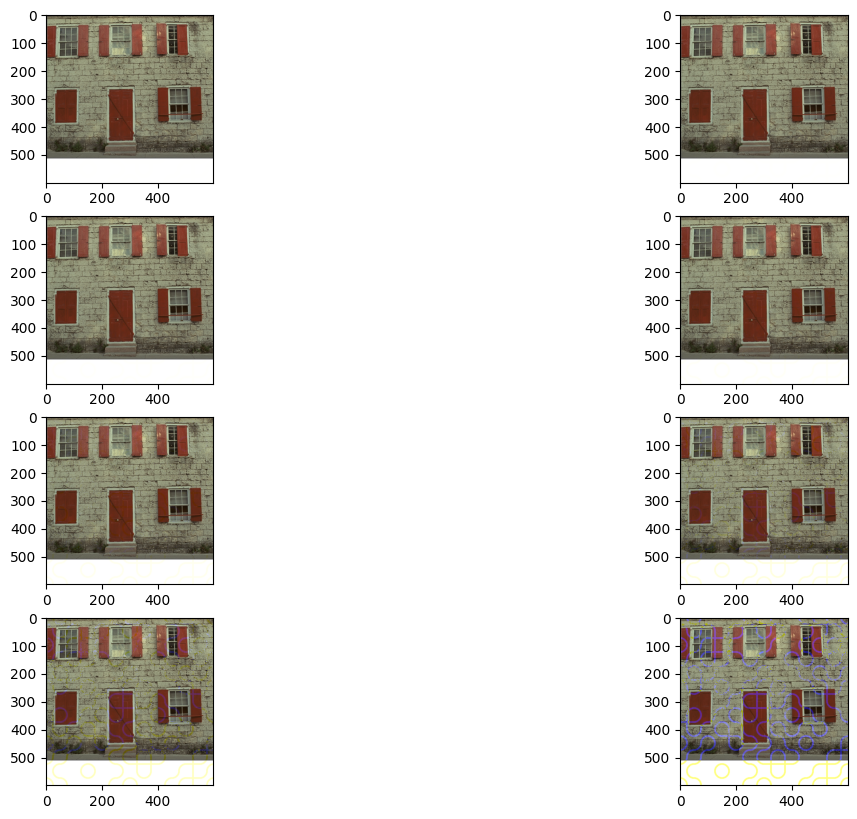

In [27]:
plt.rcParams['figure.figsize'] = [15, 10]
for i in range(8):
    img_watered = cv2.imread("kodim01_600.png")
    img_watered = cv2.cvtColor(img_watered, cv2.COLOR_BGR2RGB)
    img_watered[:,:,2] = np.bitwise_xor(img_watered[:,:,2], watermark_binary * (2 ** i))
    plt.subplot(420+i+1), plt.imshow(img_watered)  

Вбудовування малого водяного знаку з повтором

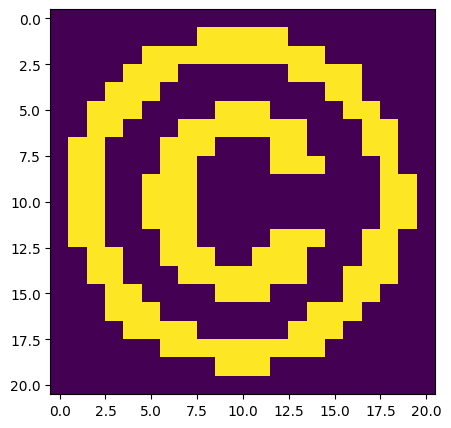

In [28]:
plt.rcParams['figure.figsize'] = [5, 5]

watermark = cv2.imread("c.jfif")
watermark = cv2.cvtColor(watermark, cv2.COLOR_BGR2GRAY)
watermark_binary = np.zeros_like(watermark)
watermark_binary[watermark < 127] = 1
plt.imshow(watermark_binary)

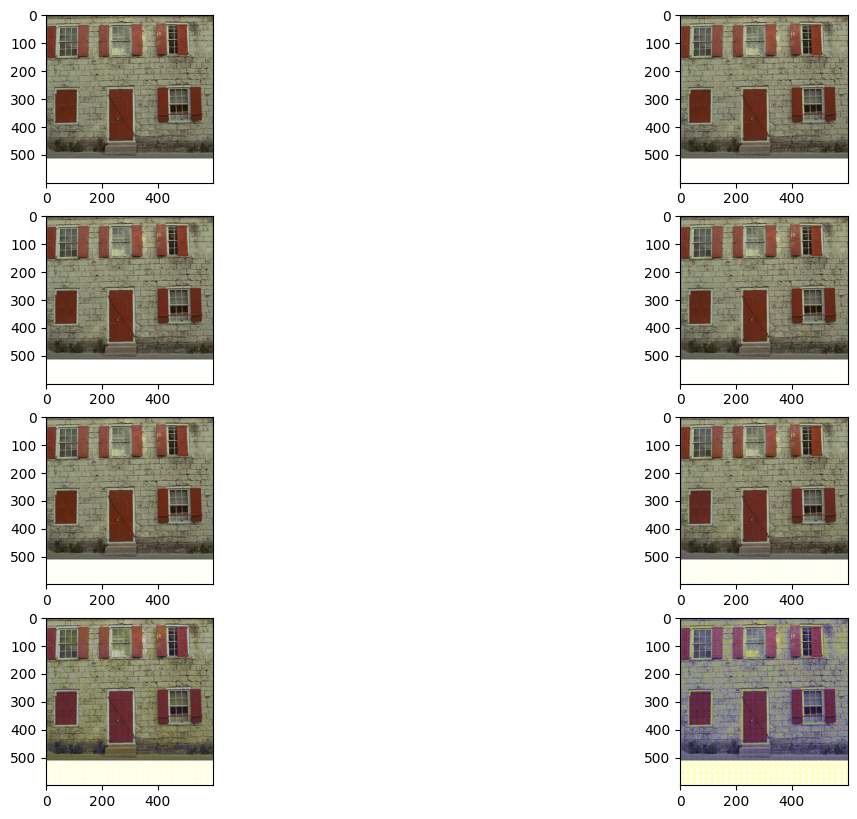

In [29]:
plt.rcParams['figure.figsize'] = [15, 10]
for i in range(8):
    img_watered = cv2.imread("kodim01_600.png")
    x_tiling = img_watered.shape[0]//watermark.shape[0]
    y_tiling = img_watered.shape[1]//watermark.shape[1]
    tiling = np.tile(watermark, (x_tiling+1, y_tiling+1))
    tiling = tiling[:img_watered.shape[0], :img_watered.shape[1]]
    watermark_tiled = np.zeros((img_watered.shape[0], img_watered.shape[1]))
    watermark_tiled[tiling < 127] = 1
    watermark_tiled = watermark_tiled.astype(np.uint8)

    img_watered = cv2.cvtColor(img_watered, cv2.COLOR_BGR2RGB)
    img_watered[:,:,2] = np.bitwise_xor(img_watered[:,:,2], watermark_tiled * (2 ** i))
    plt.subplot(420+i+1), plt.imshow(img_watered)  

Вбудовування великого водяного знаку

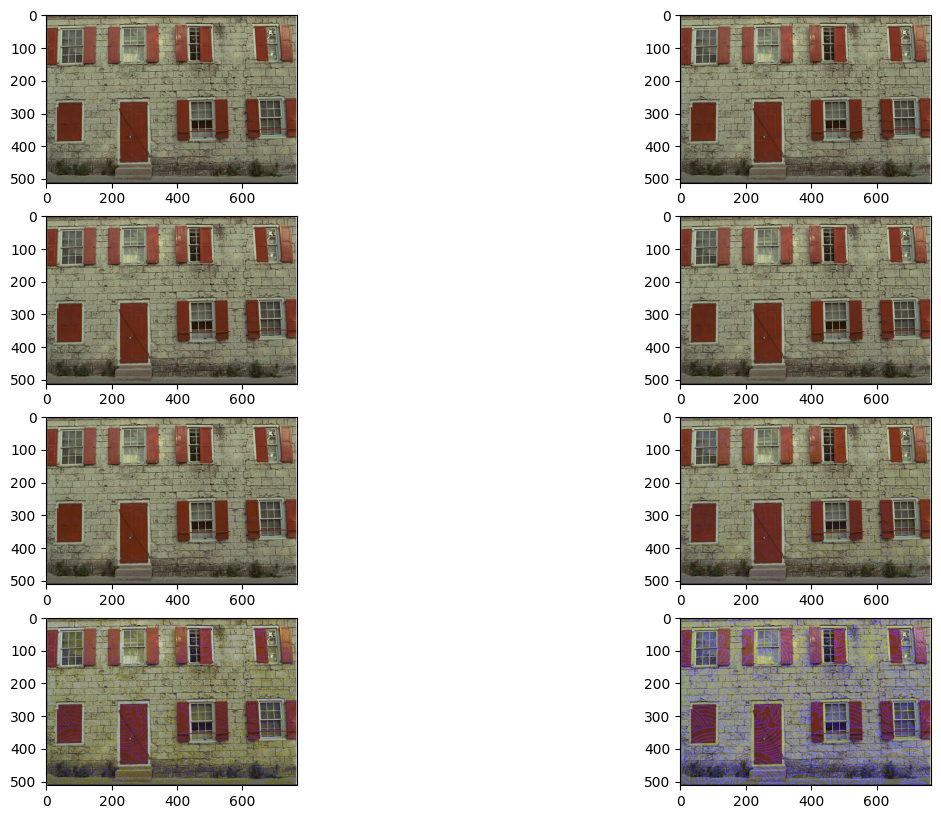

In [30]:
watermark = cv2.imread("large_watermark.png")
watermark = cv2.cvtColor(watermark, cv2.COLOR_BGR2GRAY)
watermark_binary = np.zeros_like(watermark)
watermark_binary[watermark < 200] = 1

for i in range(8):
    img_watered = cv2.imread("kodim01.png")
    watermark_binary = watermark_binary[:img_watered.shape[0], :img_watered.shape[1]]
    img_watered = cv2.cvtColor(img_watered, cv2.COLOR_BGR2RGB)
    img_watered[:,:,2] = np.bitwise_xor(img_watered[:,:,2], watermark_binary * (2 ** i))
    plt.subplot(420+i+1), plt.imshow(img_watered)  
